In [ ]:
#!pip install "onedrivesdk<2"
import matplotlib.pyplot as plt
!pip install spectral
import spectral
import numpy as np
import scipy.io as sio
import spectral.io.envi as envi
from google.colab import drive
import os


# Configurations

In [ ]:
date_of_images = "latest"    #"latest"\"earliest"   ---> earliest = using the 13/11/2018 data, latest = using the 15/11/2018 data

if date_of_images == "latest":
  drive.mount('/content/gdrive')
  os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/hyperspectral"
  %cd /content/gdrive/My Drive/hyperspectral
else:
  drive.mount('/content/gdrive')
  os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/hyperspectral_earlier"
  %cd /content/gdrive/My Drive/hyperspectral_earlier  

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/hyperspectral


#Segmentation

In [ ]:
import spectral
import glob
import cv2
from scipy.signal import medfilt2d

def NDVI(img):
    red = img.read_band(100)  # 680nm
    nir = img.read_band(124)  # 750nm

    # #Hyperspectral biochemical indices (HBCIs)
    # red = img.read_band(43)  # 515nm
    # nir = img.read_band(56)  # 550nm

    img1 = (nir - red) / (nir + red)
    spectral.imshow(img1)
    return img1

def Mask(NDVIImage):
    Mask = NDVIImage
    height = Mask.shape[0]
    width = Mask.shape[1]
    threshold = 0.22
    # threshold = 0.05
    for i in np.arange(height):
        for j in np.arange(width):
            a = Mask.item(i, j)
            if a > threshold:
                b = a
            else:
                b = 0
            Mask.itemset((i, j), b)
    median = medfilt2d(Mask, 5)
    return median

def ApplyAllImage(img, MaskImage):
    for h in range(img.shape[0]):
        for w in range(img.shape[1]):
            if MaskImage[h,w] == 0:
                for i in range(210):
                    img.itemset((h, w, i), 0)
    # spectral.imshow(img)   
    # plt.pause(1)             
    return img

def segmentation(img, name):
    NDVIImage = NDVI(img)
    # img2 = imshow(NDVIImage)
    MaskImage = Mask(NDVIImage)
    # img2 = imshow(MaskImage)
    # temp = scipy.ndimage.measurements.label(MaskImage)
    # temp = np.fft.fft2(MaskImage)
    NewImage = ApplyAllImage(img, MaskImage)
    # envi.save_image(name, NewImage, dtype=np.float32)
    return NewImage


# #main
# if __name__== "__main__":
#   img = envi.open('plot228.hdr', 'plot228').load()
#   # arr = np.array(img.load())
#   view = spectral.imshow(img, (63, 52, 36))  ## view an image of 3 channels
#   plt.pause(1)
#   print(type(view))
#   img_seg = segmentation(img, "segmented_img.hdr")



#Splitting image into 4

In [ ]:
###### split image into 4 pieces ###############
import cv2
# load image
def image_splits(image, image_array):
  # img = cv2.imread('temp_img_for_splits.jpeg')
  # img = np.load('temp_img_for_splits.npy',allow_pickle='TRUE').item()
  img = image
  ##########################################
  # At first vertical devide image         #
  ##########################################
  # start vertical devide image
  height = img.shape[0]
  width = img.shape[1]
  # Cut the image in half
  width_cutoff = width // 2
  left1 = img[:, :width_cutoff]
  right1 = img[:, width_cutoff:]
  # finish vertical devide image
  ##########################################
  # At first Horizontal devide left1 image #
  ##########################################
  #rotate image LEFT1 to 90 CLOCKWISE
  # img = cv2.rotate(left1, cv2.ROTATE_90_CLOCKWISE)
  img = np.rot90(left1,3)
  # start vertical devide image
  height = img.shape[0]
  width = img.shape[1]
  # Cut the image in half
  width_cutoff = width // 2
  l1 = img[:, :width_cutoff]
  l2 = img[:, width_cutoff:]
  # finish vertical devide image
  #rotate image to 90 COUNTERCLOCKWISE
  # l1 = cv2.rotate(l1, cv2.ROTATE_90_COUNTERCLOCKWISE)
  l1 = np.rot90(l1)
  #save
  cv2.imwrite("one_horisont_1.jpg", l1)
  #rotate image to 90 COUNTERCLOCKWISE
  # l2 = cv2.rotate(l2, cv2.ROTATE_90_COUNTERCLOCKWISE)
  l2 = np.rot90(l2,3)
  #save
  cv2.imwrite("one_horisont_2.jpg", l2)
  ##########################################
  # At first Horizontal devide right1 image#
  ##########################################
  #rotate image RIGHT1 to 90 CLOCKWISE
  # img = cv2.rotate(right1, cv2.ROTATE_90_CLOCKWISE)
  img = np.rot90(right1)
  # start vertical devide image
  height = img.shape[0]
  width = img.shape[1]
  # Cut the image in half
  width_cutoff = width // 2
  r1 = img[:, :width_cutoff]
  r2 = img[:, width_cutoff:]
  # finish vertical devide image
  #rotate image to 90 COUNTERCLOCKWISE
  # r1 = cv2.rotate(r1, cv2.ROTATE_90_COUNTERCLOCKWISE)
  r1 = np.rot90(r1, 3)
  #save
  cv2.imwrite("second_vhorisont_1.jpg", r1)
  #rotate image to 90 COUNTERCLOCKWISE
  # r2 = cv2.rotate(r2, cv2.ROTATE_90_COUNTERCLOCKWISE)
  r2 = np.rot90(r2, 3)
  #save
  cv2.imwrite("second_horisont_2.jpg", r2)
  # plt.imshow(r1)
  # plt.show()
  # plt.pause(1)
  # plt.imshow(r2)
  # plt.show()
  # plt.pause(1)
  # plt.imshow(l1)
  # plt.show()
  # plt.pause(1)
  # plt.imshow(l2)
  # plt.show()
  # plt.pause(1)
  image_array.append(r1)
  image_array.append(r2)
  image_array.append(l1)
  image_array.append(l2)
  return image_array
  

#Create imgages dataset (preprocessing)

    Plot label train_test_val
0     26     C           test
1     27     C     validation
2     28     C     validation
3     32     N          train
4     34     L           test
..   ...   ...            ...
60   238     L           test
61   239     N     validation
62   240     N          train
63   241     N          train
64   242     N          train

[65 rows x 3 columns]


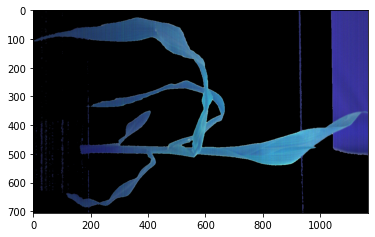

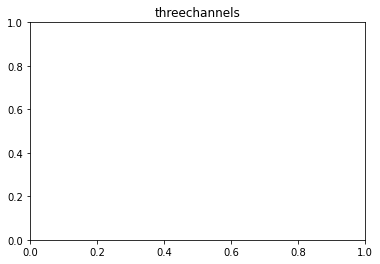

Unable to locate file "plot27.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


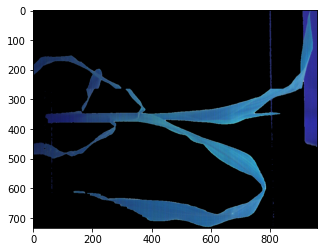

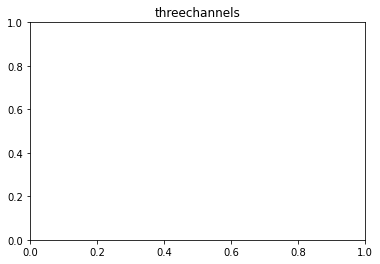

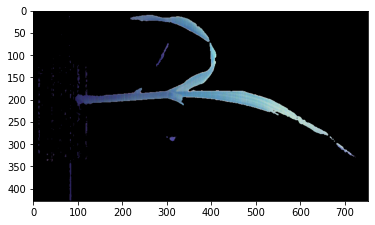

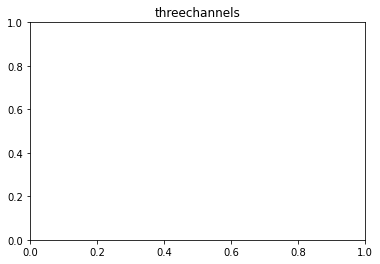

hflipped image:


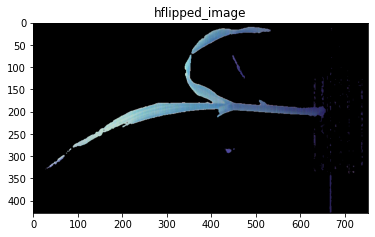

vflipped image:


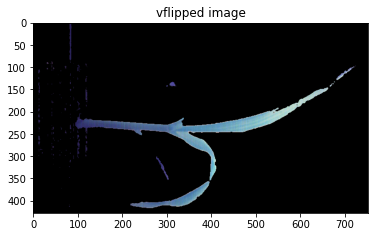

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:136: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.


bright image:


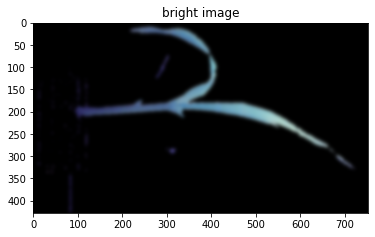

dark image:


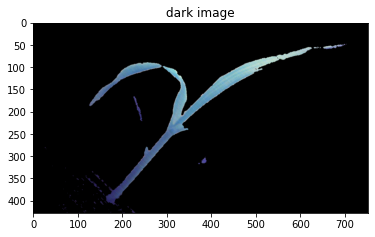

noisy image:


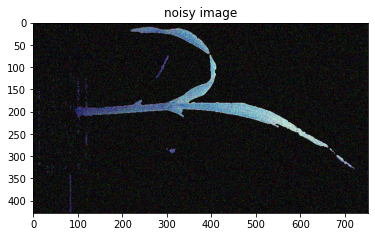

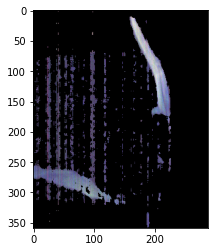

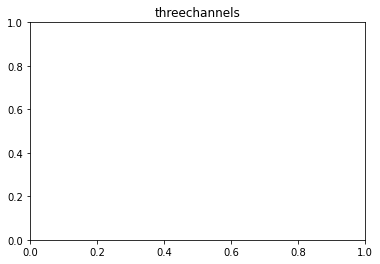

Unable to locate file "plot35.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.
Unable to locate file "plot36.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


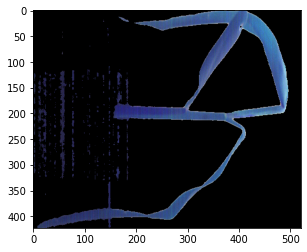

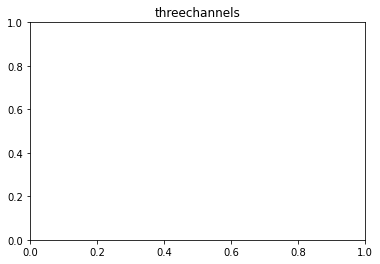

hflipped image:


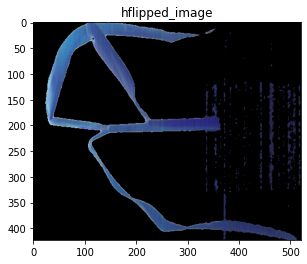

vflipped image:


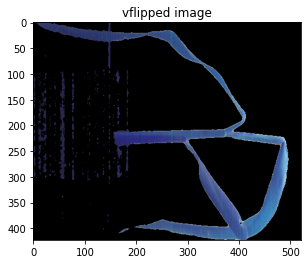

bright image:


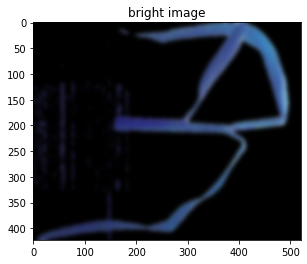

dark image:


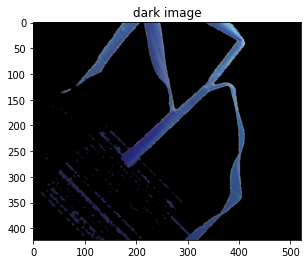

noisy image:


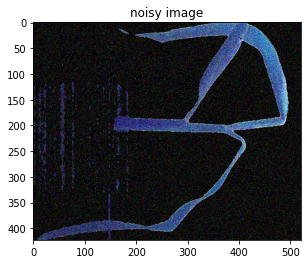

Unable to locate file "plot38.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


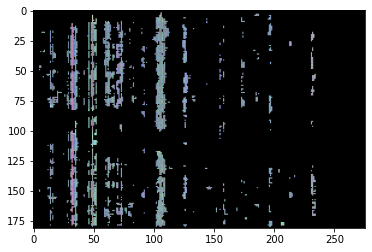

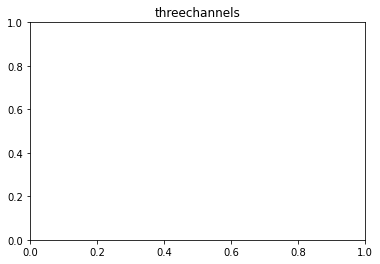

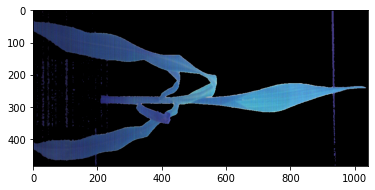

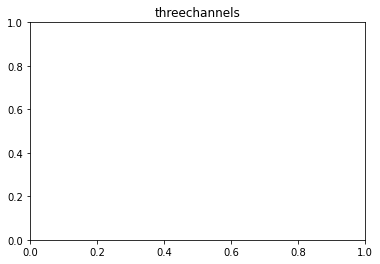

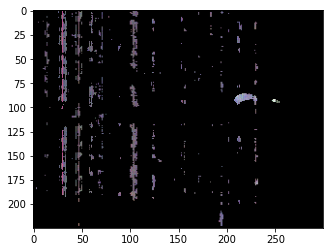

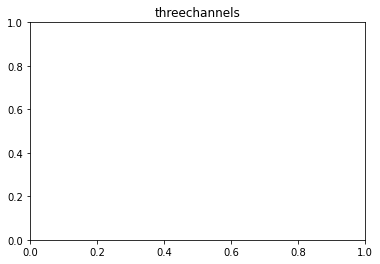

hflipped image:


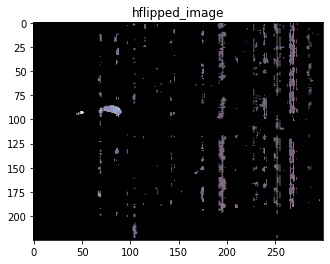

vflipped image:


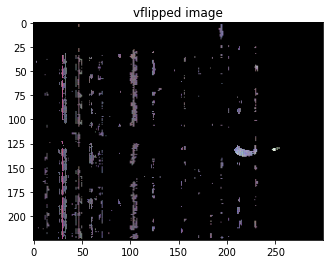

bright image:


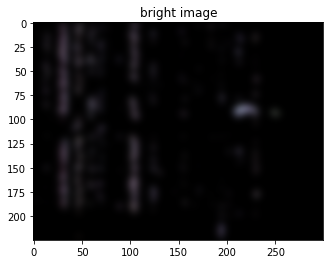

dark image:


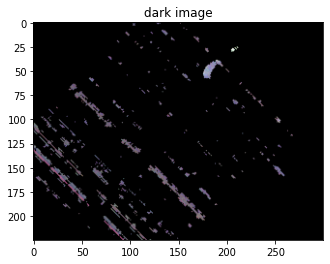

noisy image:


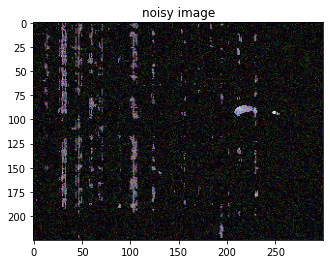

Unable to locate file "plot42.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


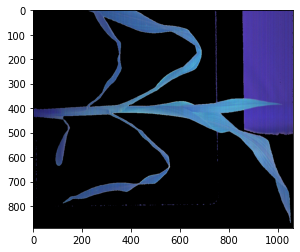

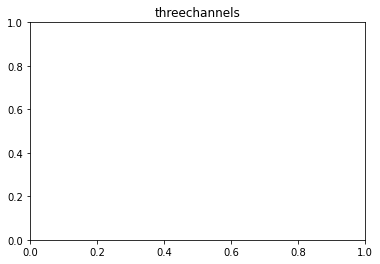

hflipped image:


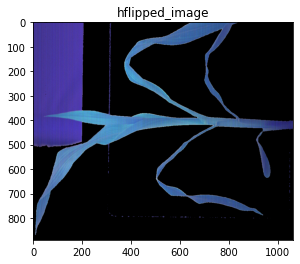

vflipped image:


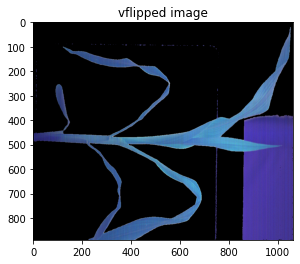

bright image:


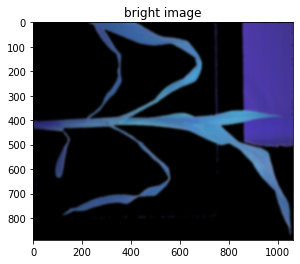

dark image:


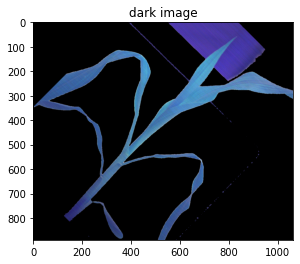

noisy image:


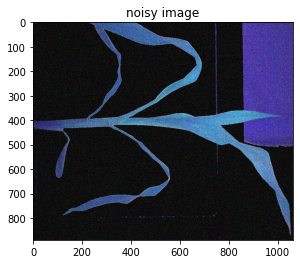

Unable to locate file "plot77.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


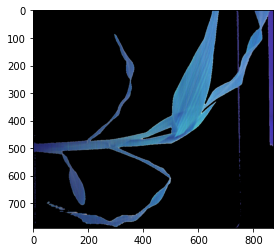

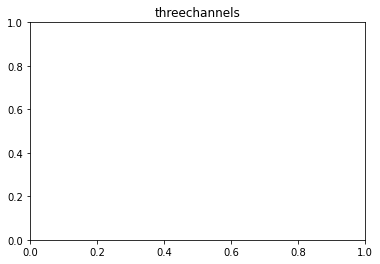

hflipped image:


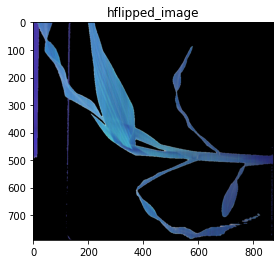

vflipped image:


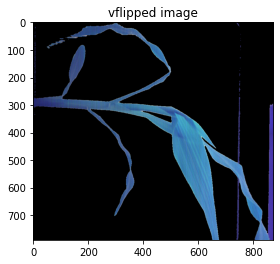

bright image:


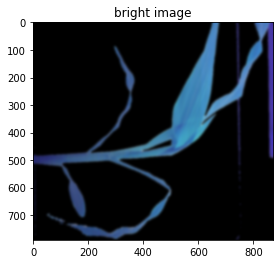

dark image:


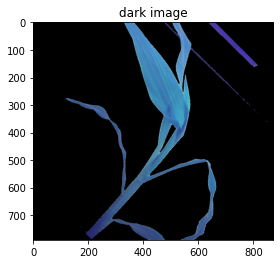

noisy image:


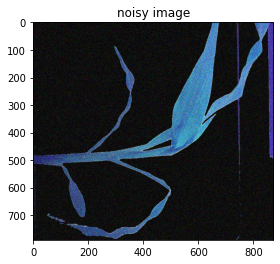

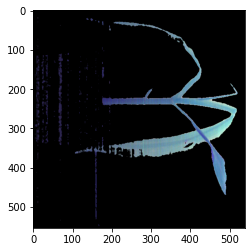

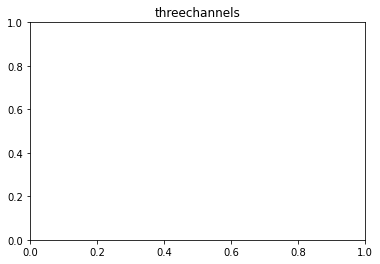

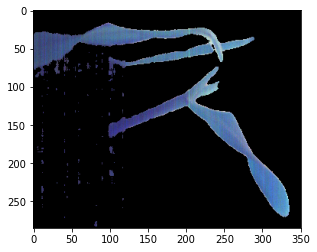

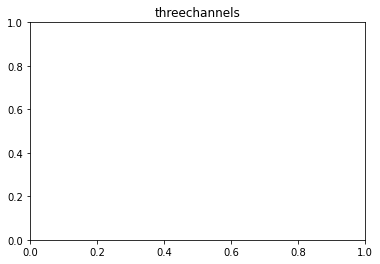

Unable to locate file "plot85.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


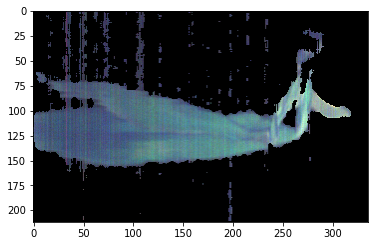

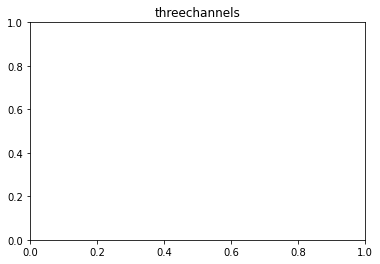

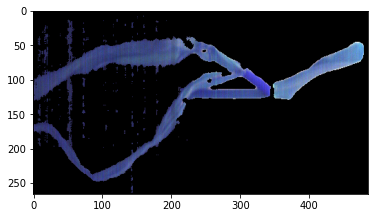

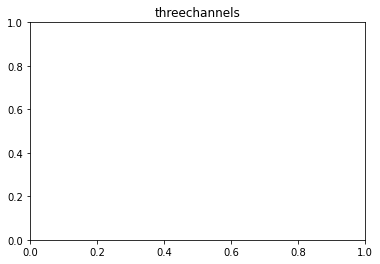

hflipped image:


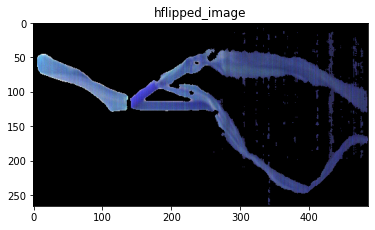

vflipped image:


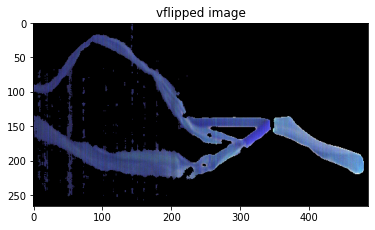

bright image:


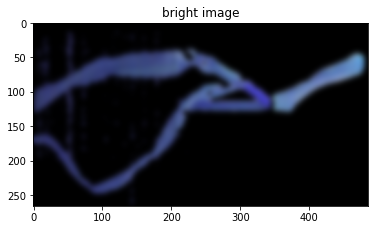

dark image:


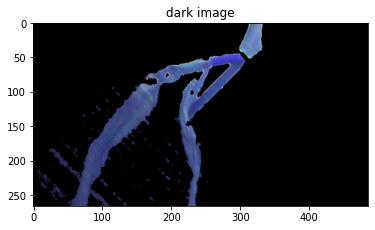

noisy image:


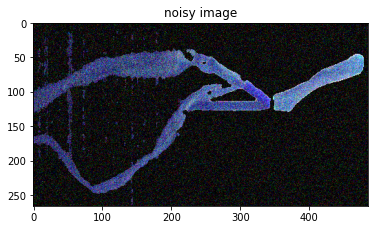

Unable to locate file "plot88.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.
Unable to locate file "plot89.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


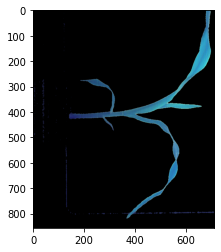

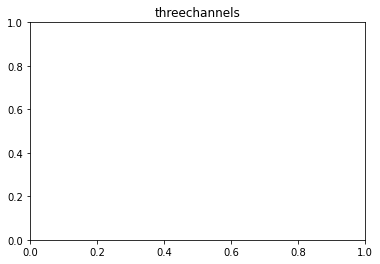

hflipped image:


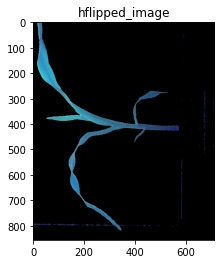

vflipped image:


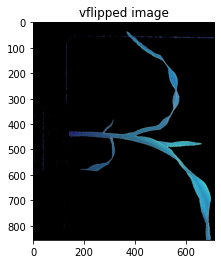

bright image:


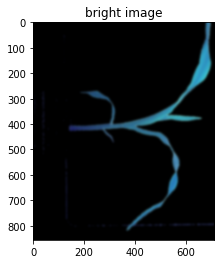

dark image:


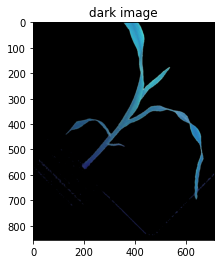

noisy image:


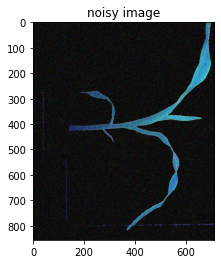

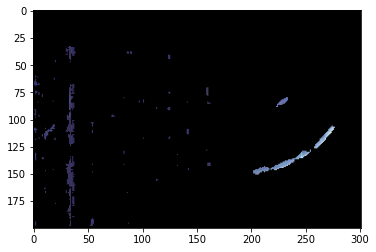

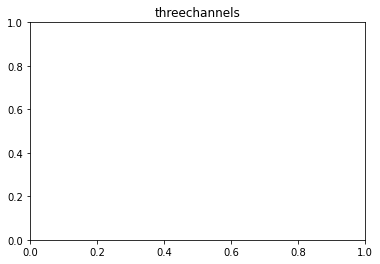

hflipped image:


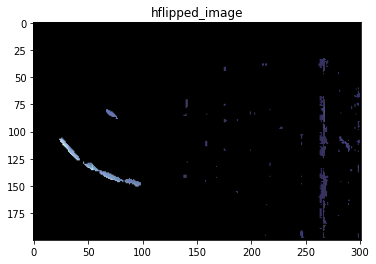

vflipped image:


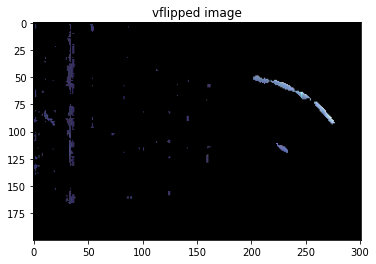

bright image:


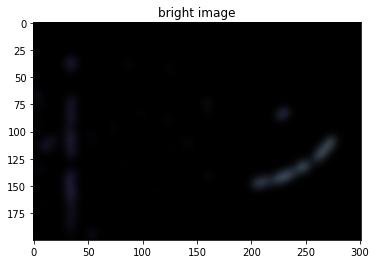

dark image:


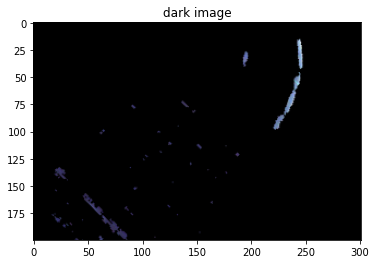

noisy image:


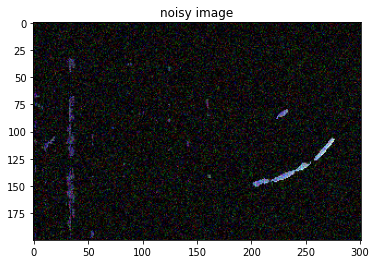

Unable to locate file "plot92.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


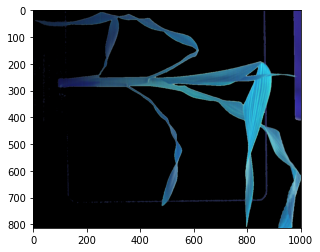

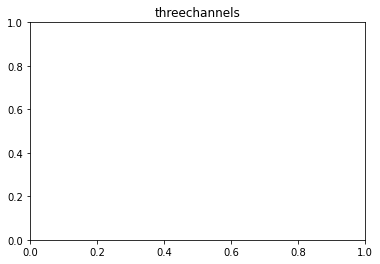

hflipped image:


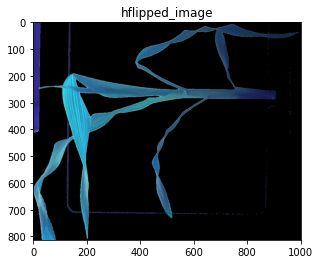

vflipped image:


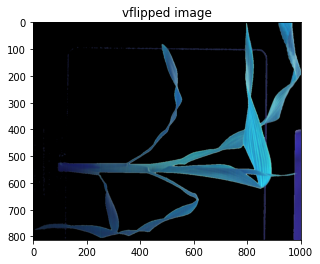

bright image:


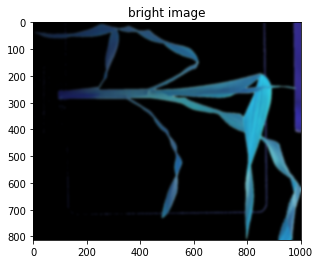

dark image:


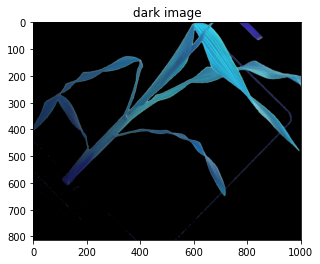

noisy image:


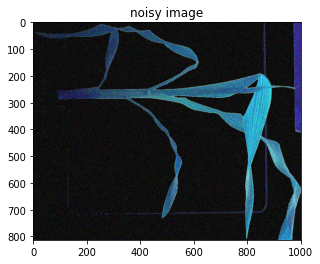

Unable to locate file "plot127.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


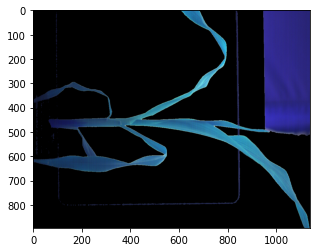

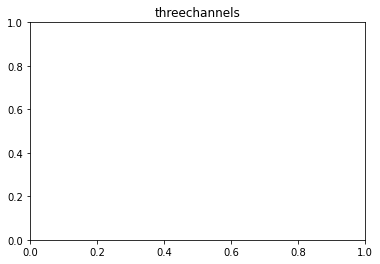

hflipped image:


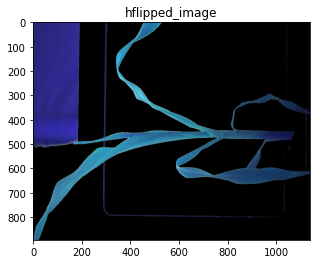

vflipped image:


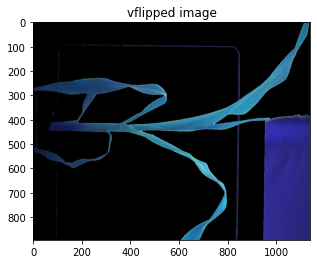

bright image:


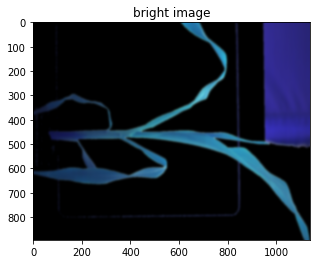

dark image:


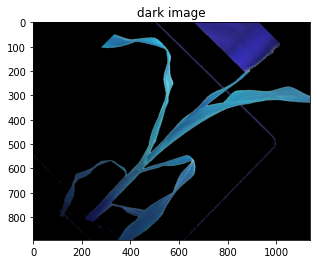

noisy image:


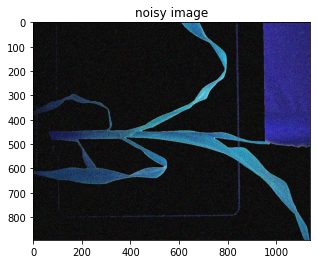

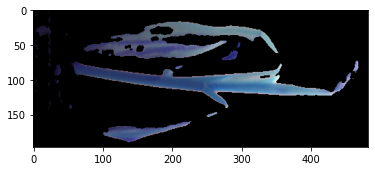

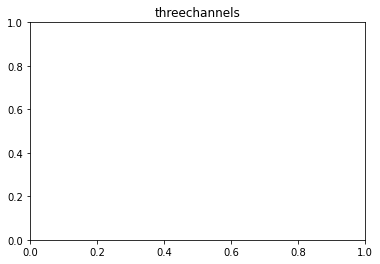

hflipped image:


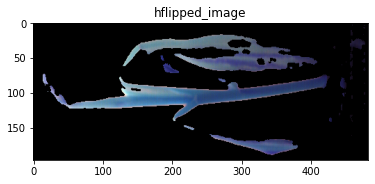

vflipped image:


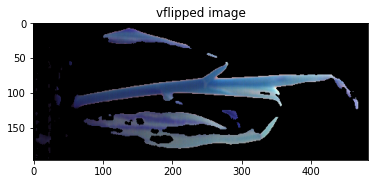

bright image:


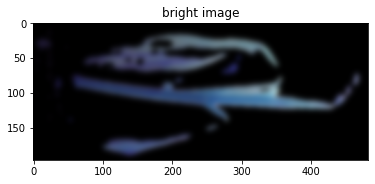

dark image:


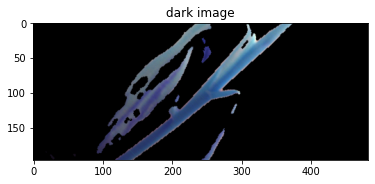

noisy image:


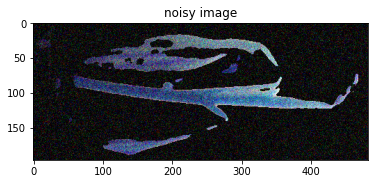

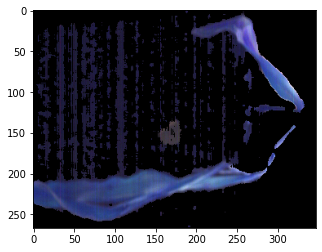

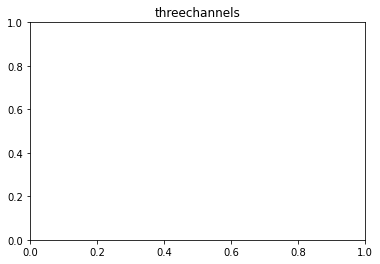

Unable to locate file "plot135.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


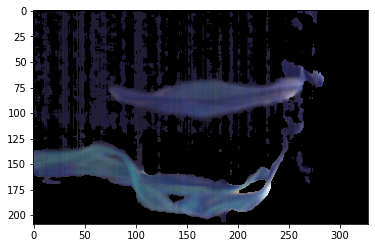

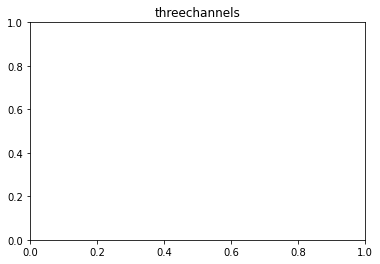

hflipped image:


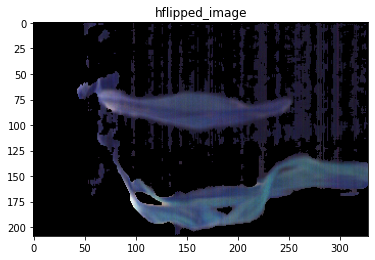

vflipped image:


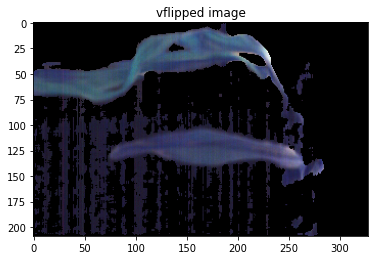

bright image:


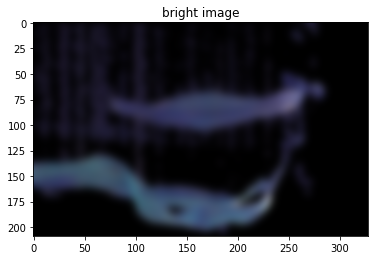

dark image:


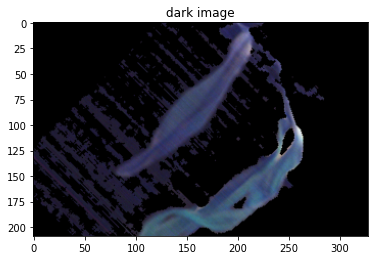

noisy image:


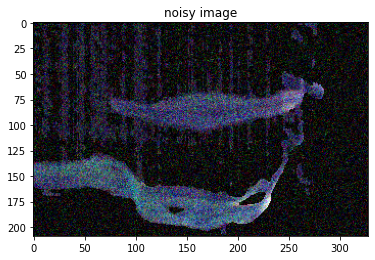

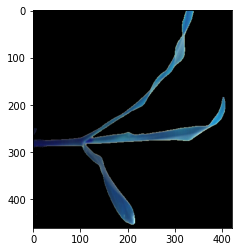

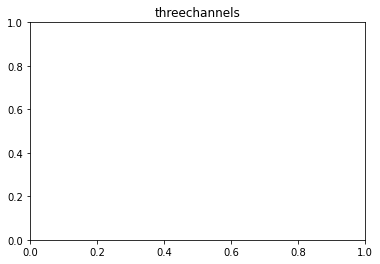

hflipped image:


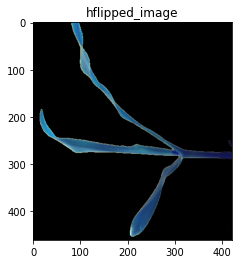

vflipped image:


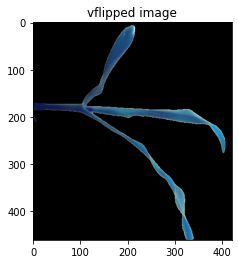

bright image:


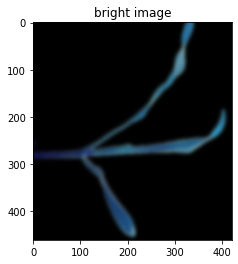

dark image:


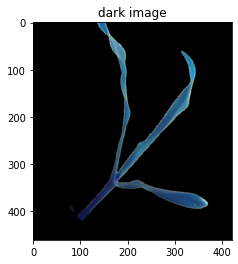

noisy image:


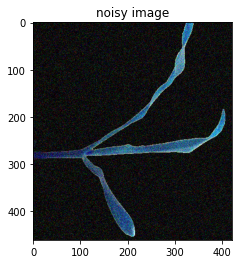

Unable to locate file "plot138.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.
Unable to locate file "plot139.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


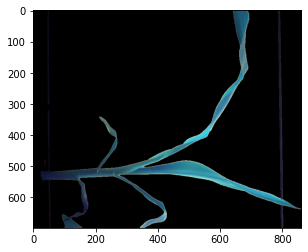

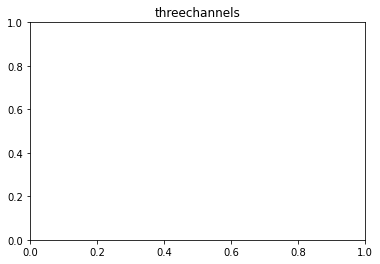

hflipped image:


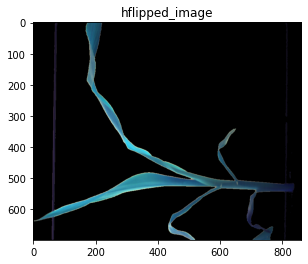

vflipped image:


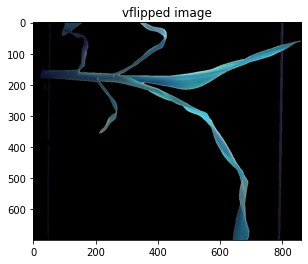

bright image:


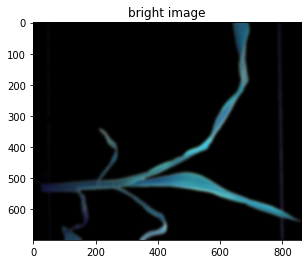

dark image:


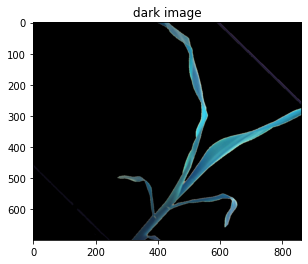

noisy image:


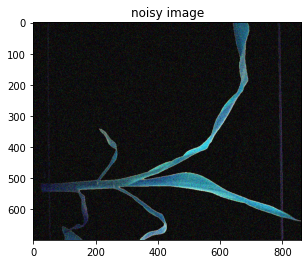

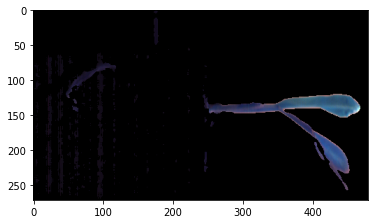

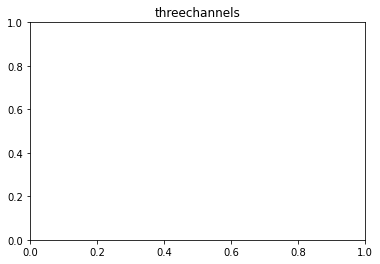

Unable to locate file "plot142.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


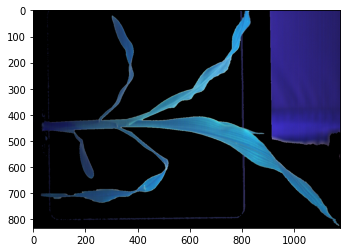

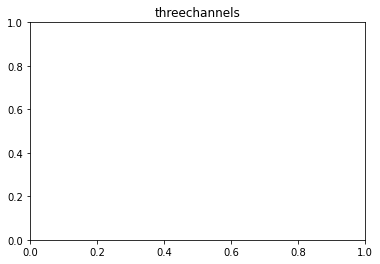

Unable to locate file "plot177.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


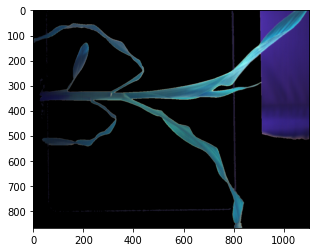

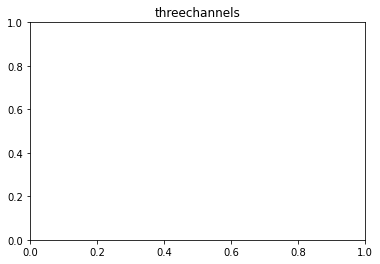

hflipped image:


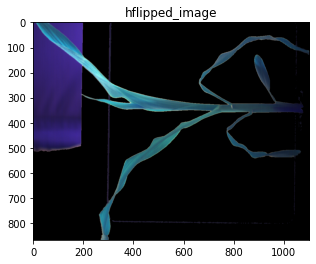

vflipped image:


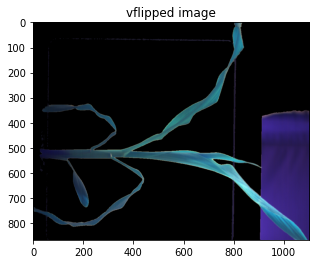

bright image:


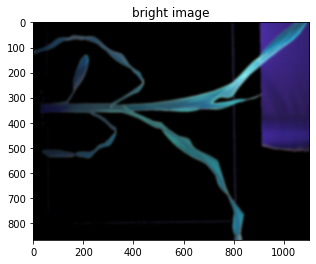

dark image:


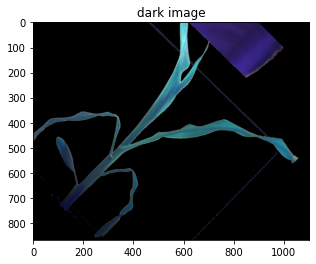

noisy image:


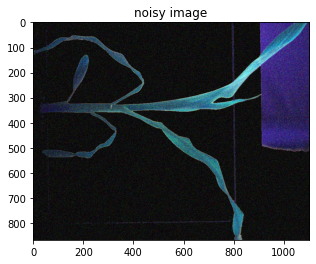

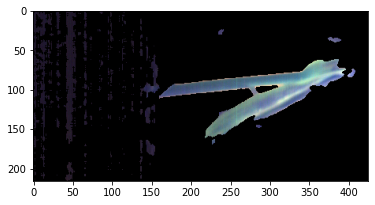

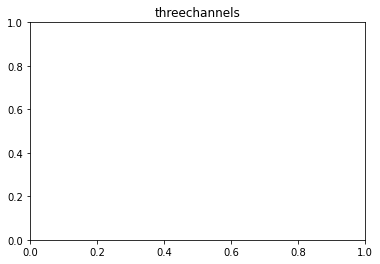

hflipped image:


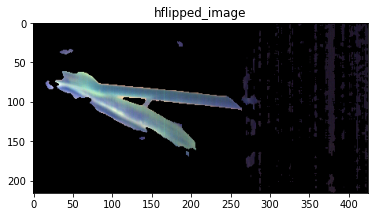

vflipped image:


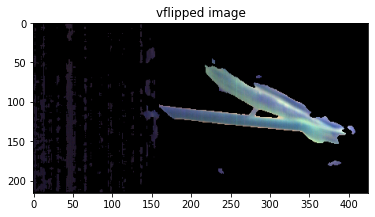

bright image:


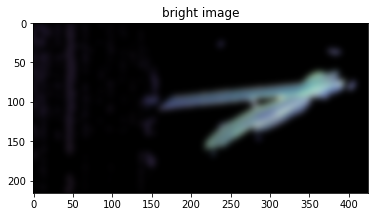

dark image:


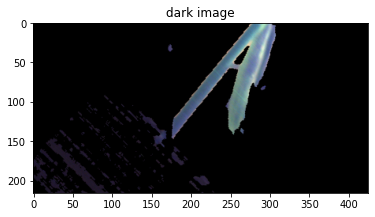

noisy image:


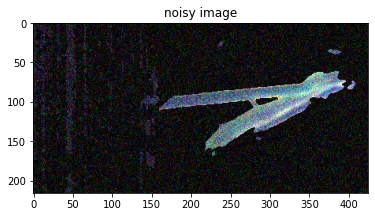

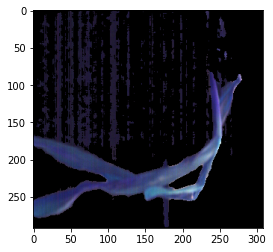

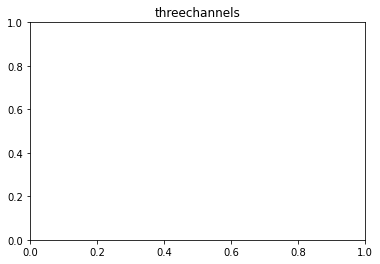

Unable to locate file "plot185.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


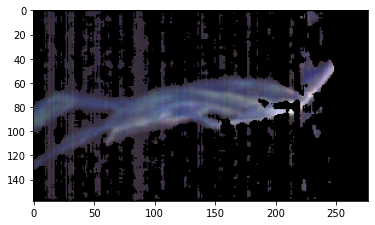

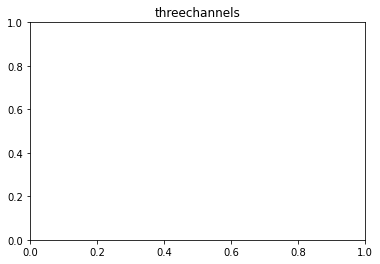

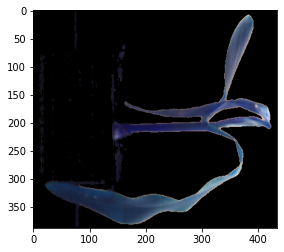

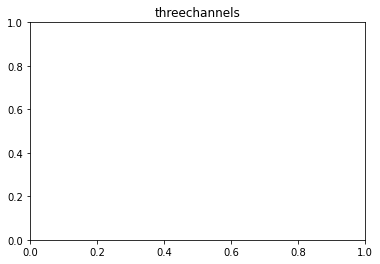

hflipped image:


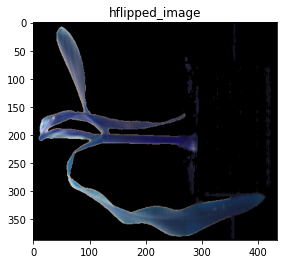

vflipped image:


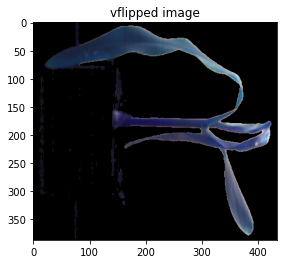

bright image:


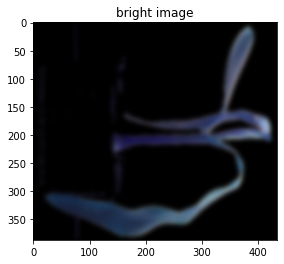

dark image:


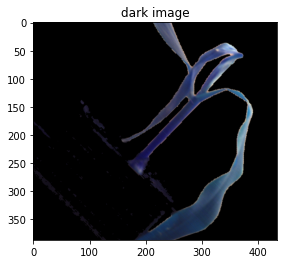

noisy image:


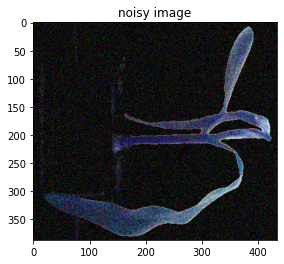

Unable to locate file "plot188.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.
Unable to locate file "plot189.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


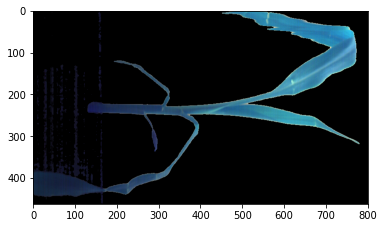

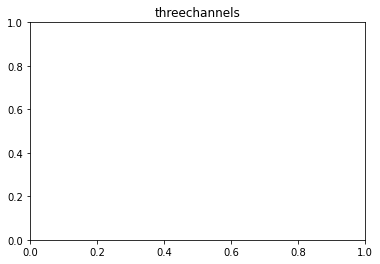

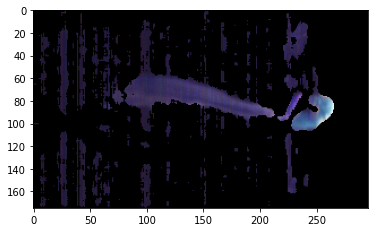

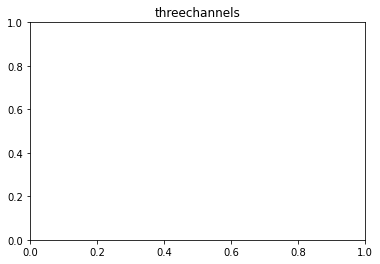

hflipped image:


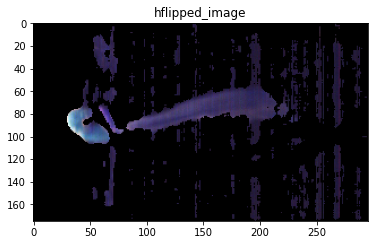

vflipped image:


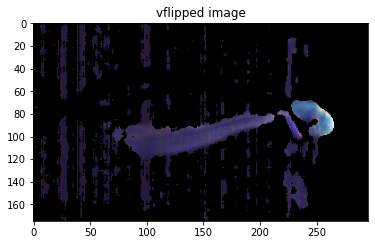

bright image:


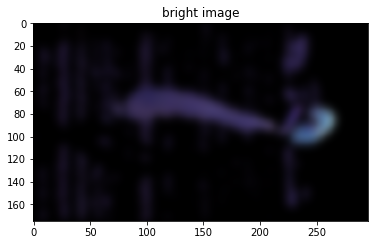

dark image:


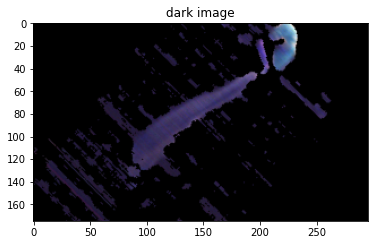

noisy image:


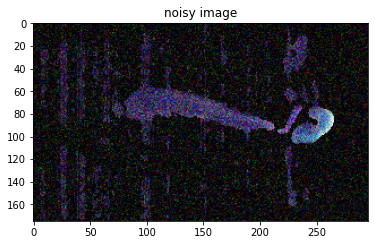

Unable to locate file "plot192.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


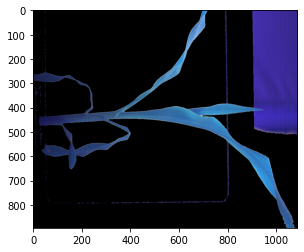

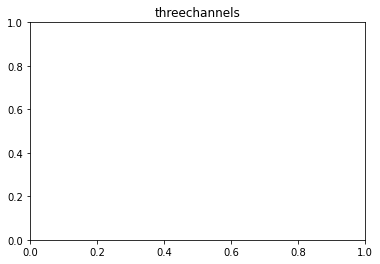

Unable to locate file "plot227.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


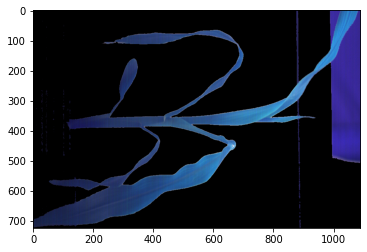

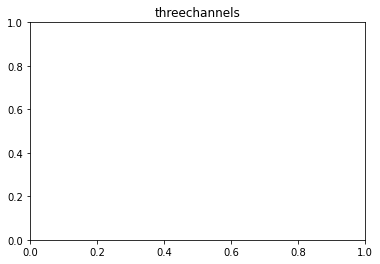

hflipped image:


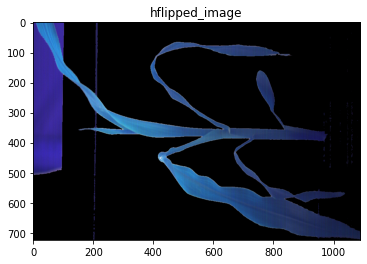

vflipped image:


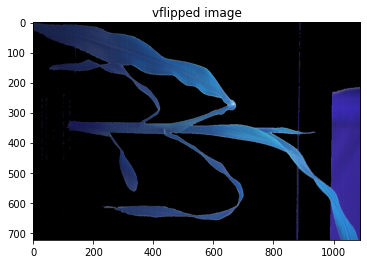

bright image:


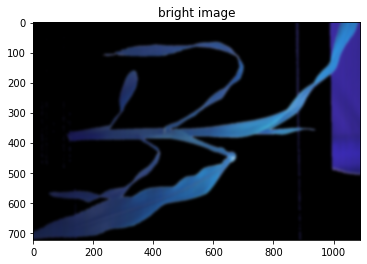

dark image:


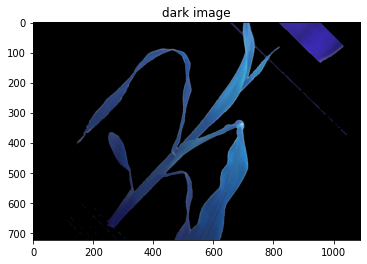

noisy image:


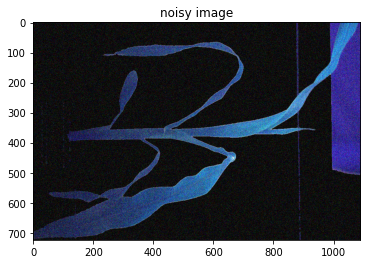

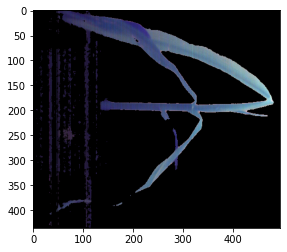

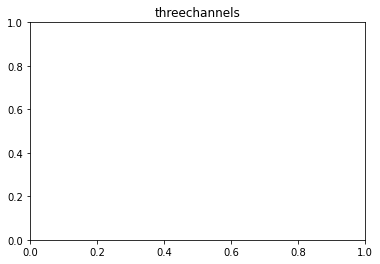

hflipped image:


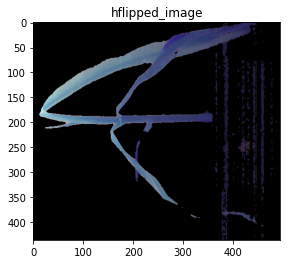

vflipped image:


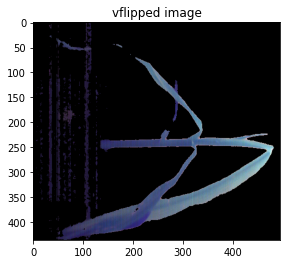

bright image:


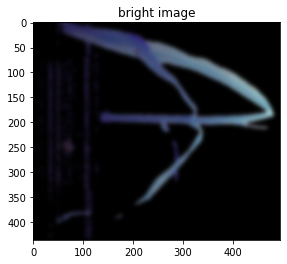

dark image:


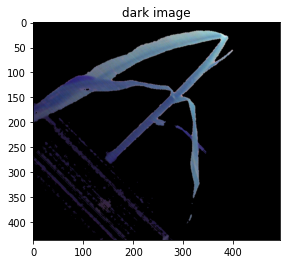

noisy image:


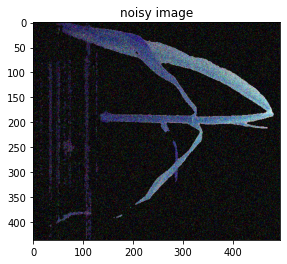

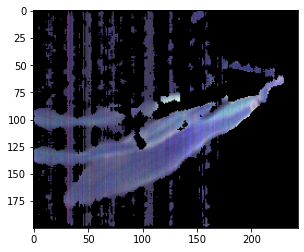

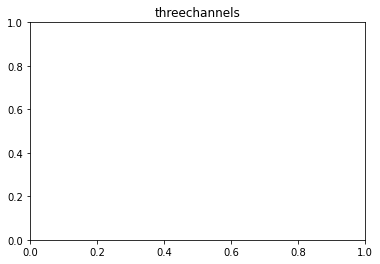

Unable to locate file "plot235.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


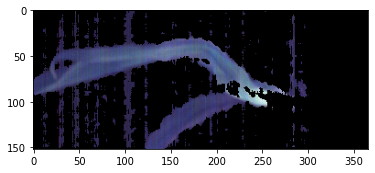

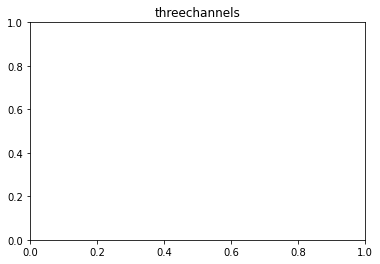

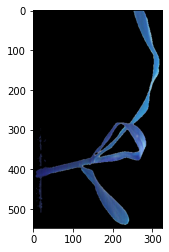

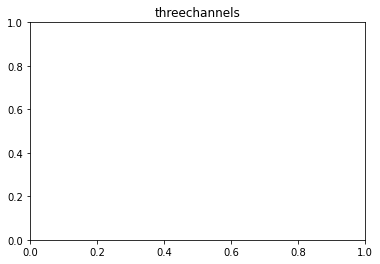

hflipped image:


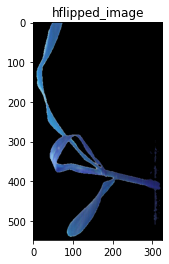

vflipped image:


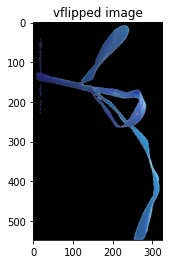

bright image:


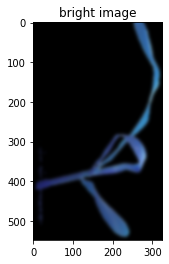

dark image:


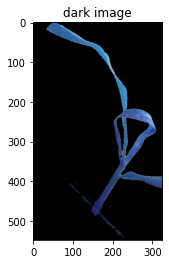

noisy image:


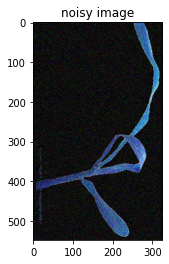

Unable to locate file "plot238.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


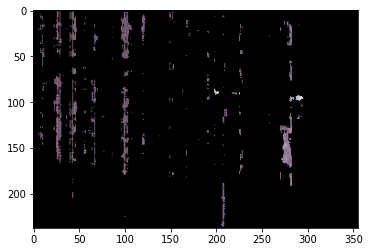

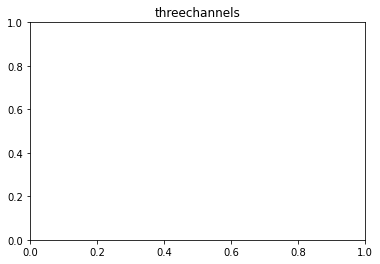

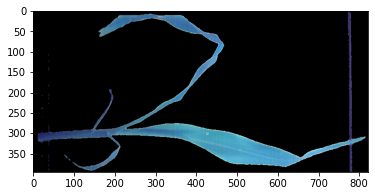

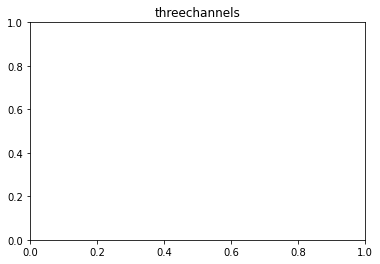

hflipped image:


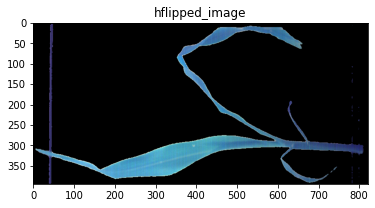

vflipped image:


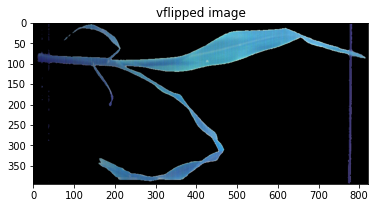

bright image:


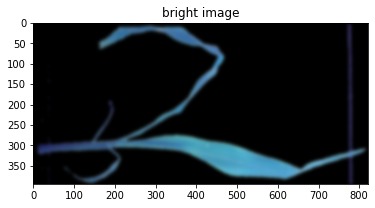

dark image:


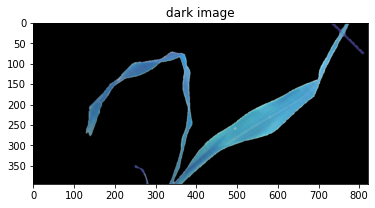

noisy image:


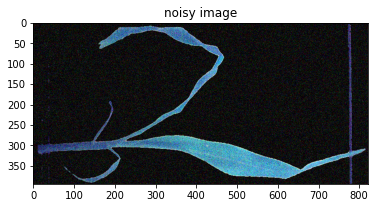

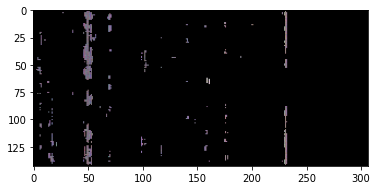

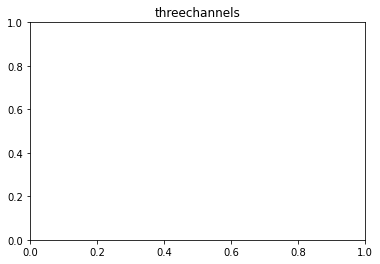

hflipped image:


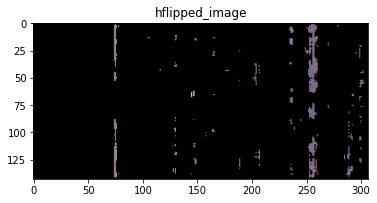

vflipped image:


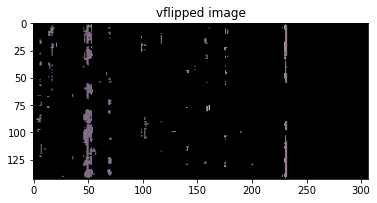

bright image:


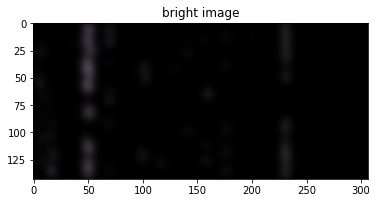

dark image:


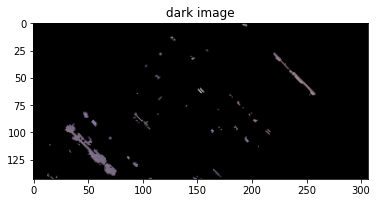

noisy image:


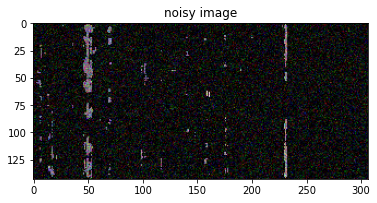

Unable to locate file "plot242.hdr". If the file exists, use its full path or place its directory in the SPECTRAL_DATA environment variable.


In [ ]:
########## creating images dataset with image splitting ###################
from skimage import data, exposure, img_as_float
import pandas as pd
from PIL import Image
from skimage.filters import gaussian
import pylab as pl
from skimage.util import random_noise
from skimage.transform import rotate

  ##########################################
  #             configurations
  ##########################################

  # mode = what features selection (which 3 channels will be chosen)

segment = True
mode = "article_ipmortance_490_550_720" # "RGB"\"important_bands_2_60_102_140"\"PCA"\"important_bands_1_10_56_141"\"article_ipmortance_490_550_720"\"PCA"
# important_bands = "feature importance 2 = 60_102_140"

def randRange(a, b):
    '''
    a utility functio to generate random float values in desired range
    '''
    np.random.seed(97)
    return pl.rand() * (b - a) + a



labels = pd.read_csv('hyperspectral_classes.csv',header=0)
print(labels)
train_data = {'images': [], 'labels': []}
val_data = {'images': [], 'labels': []}
test_data = {'images': [], 'labels': []}

for index, row in labels.iterrows():
  try:
    img = envi.open('plot'+str(row['Plot'])+'.hdr', 'plot'+str(row['Plot'])).load() ## read image
    if segment:
      img = segmentation(img, "segmented_img.hdr") ## segment image
  except Exception as e:
    print(e)
    continue  
  # view = spectral.imshow(img, (63, 52, 36))  ## view an image of 3 channels
  # plt.pause(1)
  # print(type(view))

  ### convert to Numpy ###
  # arr = img.load()


  # ### PCA ###
  # pc = spectral.principal_components(img)
  # # v = spectral.imshow(pc.cov)
  # plt.pause(1)
  # pc_0999 = pc.reduce(fraction=0.999)

  # eigen_values = len(pc_0999.eigenvalues)

  # img_pc = pc_0999.transform(img)
  # print("spectral api image:")
  # v = spectral.imshow(img_pc[:, :, :3])
  # plt.pause(1)

  if mode == "important_bands_2_60_102_140":
    threechannels = spectral.get_rgb(img,bands=(60,102,140))
  elif mode == "important_bands_1_10_56_141":
    threechannels = spectral.get_rgb(img,bands=(10,56,141)) 
  elif mode == "article_ipmortance_490_550_720":
    threechannels = spectral.get_rgb(img,bands=(35,56,115))
  elif mode == "PCA":
    pc = spectral.principal_components(img)
    pc_0999 = pc.reduce(fraction=0.999)
    img_pc = pc_0999.transform(img)   
    threechannels = img_pc[:, :, :3]
  else:
    threechannels = spectral.get_rgb(img)

  # print("numpy arr image:")
  # threechannels = img_pc[:, :, :3]
  plt.imshow(threechannels)
  plt.pause(1)
  ## append image and label to the data dictionaries according to test\val\train:
  if row['train_test_val'] == 'train':
    # train_data['images'].append(threechannels)
    # threechannels = Image.fromarray((threechannels * 255).astype(np.uint8))
    # np.save('temp_img_for_splits.npy', threechannels) 
    train_data['images'] = image_splits(threechannels, train_data['images'])
    train_data['labels'].append(row['label'])
    train_data['labels'].append(row['label'])
    train_data['labels'].append(row['label'])
    train_data['labels'].append(row['label'])
    plt.title("threechannels")
    plt.show()
  elif row['train_test_val'] == 'validation':
    # threechannels = Image.fromarray((threechannels * 255).astype(np.uint8))
    # np.save('temp_img_for_splits.npy', threechannels) 
    val_data['images'] = image_splits(threechannels, val_data['images'])
    val_data['labels'].append(row['label'])
    val_data['labels'].append(row['label'])
    val_data['labels'].append(row['label'])
    val_data['labels'].append(row['label'])
    plt.title("threechannels")
    plt.show()
    continue
  else:
    # threechannels = Image.fromarray((threechannels * 255).astype(np.uint8))
    # np.save('temp_img_for_splits.npy', threechannels) 
    test_data['images'] = image_splits(threechannels, test_data['images'])
    test_data['labels'].append(row['label'])
    test_data['labels'].append(row['label'])
    test_data['labels'].append(row['label'])
    test_data['labels'].append(row['label'])
    plt.title("threechannels")
    plt.show()
    continue

  ## append image augmentaions to the data dictionary:
  hflipped_image= np.fliplr(threechannels) #fliplr reverse the order of columns of pixels in matrix
  # hflipped_image = Image.fromarray((hflipped_image * 255).astype(np.uint8))
  # np.save('temp_img_for_splits.npy', hflipped_image)
  train_data['images'] = image_splits(hflipped_image, train_data['images'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  plt.title("hflipped_image") 
  print("hflipped image:")
  plt.imshow(hflipped_image)
  plt.pause(1)

  #Vertically flipped
  vflipped_image= np.flipud(threechannels) #flipud reverse the order of rows of pixels in matrix
  # vflipped_image = Image.fromarray((vflipped_image * 255).astype(np.uint8))
  # np.save('temp_img_for_splits.npy', vflipped_image)
  train_data['images'] = image_splits(vflipped_image, train_data['images'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  plt.title("vflipped image") 
  print("vflipped image:") 
  plt.imshow(vflipped_image)
  plt.pause(1)


  # gaussian filter
  image_bright = gaussian(threechannels, sigma=randRange(0, 5)) 
  print("bright image:") 
  plt.title("bright image")
  plt.imshow(image_bright)
  plt.pause(1)
  # image_bright = Image.fromarray((image_bright * 255).astype(np.uint8))
  # np.save('temp_img_for_splits.npy', image_bright)
  train_data['images'] = image_splits(image_bright, train_data['images'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])

  # rotate 45
  image_45 = rotate(threechannels,45)
  print("dark image:")
  plt.title("dark image")  
  plt.imshow(image_45)
  plt.pause(1)
  # image_dark = Image.fromarray((image_dark * 255).astype(np.uint8))
  # np.save('temp_img_for_splits.npy', image_dark)
  train_data['images'] = image_splits(image_45, train_data['images'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])

  #noisy image:
  noisy_image= random_noise(threechannels, seed=97, var=0.02)
  print("noisy image:")
  plt.title("noisy image")  
  plt.imshow(noisy_image)
  plt.pause(1)
  # noisy_image = Image.fromarray((noisy_image * 255).astype(np.uint8))
  # np.save('temp_img_for_splits.npy', noisy_image)
  train_data['images'] = image_splits(noisy_image, train_data['images'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])
  train_data['labels'].append(row['label'])

# np.save('train_data_article_ipmortance_490_550_720_segmented.npy', train_data) 
# np.save('val_data_article_ipmortance_490_550_720_segmented.npy', val_data) 
# np.save('test_data_article_ipmortance_490_550_720_segmented.npy', test_data) 

##Save datasets

In [ ]:
##### check datasets and save them ###
# choose which name to update

# np.save('train_data.npy', train_data) 
# np.save('val_data.npy', val_data) 
# np.save('test_data.npy', test_data) 

# np.save('train_data_splitted.npy', train_data) 
# np.save('val_data_splitted.npy', val_data) 
# np.save('test_data_splitted.npy', test_data) 

# np.save('train_data_rgb.npy', train_data) 
# np.save('val_data_rgb.npy', val_data) 
# np.save('test_data_rgb.npy', test_data) 

# np.save('train_data_rgb_segmented_EARLY.npy', train_data) 
# np.save('val_data_rgb_segmented_EARLY.npy', val_data) 
# np.save('test_data_rgb_segmented_EARLY.npy', test_data) 

# np.save('train_data_importance_2_60_102_140.npy', train_data) 
# np.save('val_data_importance_2_60_102_140.npy', val_data) 
# np.save('test_data_importance_2_60_102_140.npy', test_data) 

# np.save('train_data_importance_10_56_141.npy', train_data) 
# np.save('val_data_importance_10_56_141.npy', val_data) 
# np.save('test_data_importance_10_56_141.npy', test_data) 

# np.save('train_data_importance_2_60_102_140_segmented.npy', train_data) 
# np.save('val_data_importance_2_60_102_140_segmented.npy', val_data) 
# np.save('test_data_importance_2_60_102_140_segmented.npy', test_data) 

print(len(train_data['labels']))
print(len(train_data['images']))

print(threechannels.shape)

print(len(val_data['images']))
print(len(val_data['labels']))

print(len(test_data['images']))
print(len(test_data['labels']))

tr1 = train_data['labels']
tr2 = train_data['images']

v1 = val_data['images']
v2 = val_data['labels']

ts1 = test_data['images']
ts2 = test_data['labels']


552
552
(143, 307, 3)
28
28
44
44


#CNN Model

In [ ]:
!pip install -q keras
!pip install tensorflow
from PIL import Image
import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Dense
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import image
# from keras.applications.resnet50 import ResNet50
!pip install keras-resnet
from keras_resnet.models import ResNet50, ResNet101, ResNet152
from tensorflow.keras.applications.resnet50 import preprocess_input,decode_predictions
from tensorflow.keras import regularizers
from sklearn.metrics import classification_report, confusion_matrix,recall_score,f1_score,precision_score
import seaborn as sns
from keras import backend as K


tf.random.set_seed(97)

Binary_classification = False
# device_name = tf.test.gpu_device_name()
# if device_name != '/device:GPU:0':
#   raise SystemError('GPU device not found')
# print('Found GPU at: {}'.format(device_name))

def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

def PrepareResNet(n): ## creates a model, base on ResNet50V2, replace the last layer, and then train n layers according to the train data
    # ----------- create the ResNet50V2 "skeleton" with imagenet weights. change last layer------------
    loss = 'binary_crossentropy'
    activation ='sigmoid'
    if Binary_classification:
      neurons_number = 1

    else:
      neurons_number = 3
      loss = 'categorical_crossentropy'
      activation ='softmax'

    input_tensor = Input(shape=(224, 224, 3))
    ResNet = tf.keras.applications.resnet_v2.ResNet50V2(include_top=True, weights='imagenet', input_tensor=input_tensor,
                                                     input_shape=None,pooling='avg', classes=1000)  # get the res net as required
    ResNet.layers.pop()
    last_layer = Dense(neurons_number, activation=activation, name='output_layer')(ResNet.layers[-2].output)  ## Insert output layer
    kernel_regularizer = keras.regularizers.l2(0.01)
    #out = last_layer(ResNet.layers[-1].output)
    NewResNet = Model(inputs=ResNet.input, outputs=last_layer)
    # ----------------------------------------------------------------------------------------------------

    # ----------- Number of trained layers. if commented out - will train all net ------------

    # for layer in NewResNet.layers[:-(n)]:
    #     layer.trainable = False

    #-----------------------------------------------------------------------------------------
    sgd = SGD(decay = 0.00001)
    NewResNet.compile(loss=loss, optimizer=sgd, metrics=['accuracy',f1_m,precision_m, recall_m])
    print(NewResNet.summary())
    return(NewResNet)

def PreProcess_imgs(DATA): ## pre-process images so they can fit to the RESNET model.
    proceesedImages = []
    for P_img in DATA:
        # print (type(P_img))
        # P_img = Image.fromarray(P_img.astype(np.float32))
        # P_img.resize(size=(224, 224))
        # P_img.save("temp_img.jpeg")
        # envi.save_image("temp_img.jpeg", P_img, dtype=np.float32)
        # normalized_P_img = (P_img - np.min(P_img))/(np.max(P_img) - np.min(P_img)) # this set the range from 0 till 1
        # P_img = (normalized_P_img * 255).astype(np.uint8)
        # plt.imshow(P_img)
        # plt.show()
        # size = (224, 224)
        # P_img = image.resize(P_img, size)

        # P_img = image.array_to_img(P_img, dtype=float32)  

        image.save_img("temp_img.png",P_img,scale=True)
        P_img = image.load_img("temp_img.png", target_size=(224, 224))

        # plt.imshow(P_img)
        # plt.show()

        # P_img = image.img_to_array(P_img)
        P_img = np.reshape(P_img,(224,224,-1))      
        P_img = np.expand_dims(P_img, axis=0)

        P_img = preprocess_input(P_img)
        # P_img = P_img.astype(np.float32)



        proceesedImages.append(P_img)
    proceesedImages = np.array(proceesedImages)  
    # proceesedImages = np.asarray(proceesedImages).astype(np.float32)  
    proceesedImages = np.rollaxis(proceesedImages, 1, 0)
    proceesedImages = proceesedImages[0]
    print(len(proceesedImages))
    return proceesedImages # returns the processed images that fits to the model

def train_Base_model(train_data, val_data, test_data): ## train a model, using the new, changed resnet model, with the train flowers data. prints loss\accuracy plots
    # --------------------------- preparing and dividing the train data--------------
    
    Imagetrain = train_data['images']
    Imagetest = test_data['images']
    Imageval = val_data['images']

    Labeltrain = train_data['labels']
    Labeltest = test_data['labels']
    Labelval = val_data['labels']
    #Imagetrain, Imageval, Labeltrain, Labelval = train_test_split(Imagetrain, Labeltrain, test_size=0.2, random_state=2) # 0.2 validation size was used for the tuning part
    # Imagetrain, Imageval, Labeltrain, Labelval = train_test_split(Imagetrain, Labeltrain, test_size=0.1, random_state=2) # 0.1 validation size will be used for test part
    Imagetrain=PreProcess_imgs(Imagetrain)
    Imageval=PreProcess_imgs(Imageval)
    Imagetest = PreProcess_imgs(Imagetest)
    Labelval = np.array(Labelval)    
    Labeltrain = np.array(Labeltrain)
    Labeltest = np.array(Labeltest)
    
    base_model=PrepareResNet(5)
    # ------------------------------------------------------------------------------
    #--------------------------- training the model--------------------------------

    Early_Stop = keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.1, patience=15,restore_best_weights=True)
    History = keras.callbacks.History()
    print("training!!!")
    # print(Labeltrain.shape)
    # print(Imagetrain.shape)
    # print(Imageval.shape)
    # print(Labelval.shape)
    Labeltrain = np.unique(Labeltrain, return_inverse=True)[1]
    Labelval = np.unique(Labelval, return_inverse=True)[1]
    Labeltest = np.unique(Labeltest, return_inverse=True)[1]

    classes_number = 3
    if Binary_classification:
      classes_number = 1  
      for i, label in enumerate(Labeltrain):
        if (Labeltrain[i] == 2): 
          Labeltrain[i] = 1
      for i, label in enumerate(Labelval):
        if (Labeltrain[i] == 2):
          Labelval[i] = 1
      for i, label in enumerate(Labeltest):
        if (Labeltrain[i] == 2):
          Labeltest[i]
    print(Labeltrain)

    Labeltrain = tf.one_hot(Labeltrain, depth=classes_number)
    Labelval = tf.one_hot(Labelval, depth=classes_number)
    Labeltest = tf.one_hot(Labeltest, depth=classes_number)

    # Labeltrain = np.asarray(Labeltrain).astype('float32').reshape((-1,1))
    # Labelval = np.asarray(Labelval).astype('float32').reshape((-1,1))
    # Labeltest = np.asarray(Labeltest).astype('float32').reshape((-1,1))

    # Labeltrain = np.asarray(Labeltrain).astype(np.float32) 
    # Labelval = np.asarray(Labelval).astype(np.float32)
    # Labeltest = np.asarray(Labeltest).astype(np.float32)

    # Imagetrain = np.asarray(Imagetrain).astype(np.float32) 
    # Imageval = np.asarray(Imageval).astype(np.float32)
    # Imagetest = np.asarray(Imagetest).astype(np.float32)

    # Imagetrain = Imagetrain.astype(np.float32)
    # Imageval = Imageval.astype(np.float32)
    # Imagetest = Imagetest.astype(np.float32)   

    # proceesedImages = np.asarray(X).astype(np.float32)
    if Binary_classification:
      class_weight = {0: 1., 1: 1.}
      history = base_model.fit(Imagetrain, Labeltrain, batch_size=16,shuffle=True,class_weight=class_weight, epochs=50, verbose=1, validation_data=(Imageval, Labelval),callbacks=[History, Early_Stop])

    else:
      class_weight = {0: 1.,
                1: 10.,
                2: 2.}    
      history = base_model.fit(Imagetrain, Labeltrain, batch_size=16,shuffle=True,class_weight=class_weight, epochs=1, verbose=1, validation_data=(Imageval, Labelval),callbacks=[History, Early_Stop])
      # base_model2 = keras.models.load_model('/content/gdrive/My Drive/hyperspectral/')      

    #history=base_model.fit(Imagetrain, Labeltrain, batch_size=16, epochs=11, verbose=1, validation_data=(Imageval, Labelval))
    # print("history: ", history.history)
    # # ------------------------------------------------------------------------------
    # # --------------------------- PLOTING--------------------------------
    val_loss = history.history['val_loss']
    xc = np.arange(len(val_loss))
    train_loss = history.history['loss']
    ##### loss plot
    p = plt.figure(1, figsize=(8, 6))
    plt.plot(xc, train_loss, linewidth=2.0)
    plt.plot(xc, val_loss, linewidth=2.0)
    plt.ylim(-0.1, 5)
    plt.xlim(0, 50)
    plt.xlabel('Number of epochs', fontsize=20)
    plt.ylabel('Loss', fontsize=20)
    plt.title('Train & validation loss')
    plt.grid(True)
    plt.legend(['train', 'validation'], fontsize=20)
    plt.style.use(['classic'])
    plt.savefig(str('Train loss vs validation loss'))
    plt.show()
    
    val_acc = history.history['val_accuracy']
    train_acc = history.history['accuracy']
    #### accuracy plot
    p = plt.figure(2, figsize=(8, 6))
    plt.plot(xc, train_acc, linewidth=2.0)
    plt.plot(xc, val_acc, linewidth=2.0)
    plt.ylim(0, 1.01)
    plt.xlim(0, 50)
    plt.xlabel('Number of epochs', fontsize=20)
    plt.ylabel('Accuracy', fontsize=20)
    plt.title('Train & validation accuracy')
    plt.grid(True)
    plt.legend(['train', 'validation'], loc=4, fontsize=20)
    plt.style.use(['classic'])
    plt.savefig(str('train acc vs validation acc'))
    plt.show()
    #-------------------------------------------------------------

    return base_model,Imagetrain,Labeltrain,Imagetest,Labeltest


def save_confusion_matrix(test_labels, predictions):
    cm = confusion_matrix(test_labels, predictions,
                        normalize=None)
    ax = plt.subplot()
    hm = sns.heatmap(cm, annot=True, ax=ax, cmap='Blues')
    hm = hm.get_figure()

    # ax.set_title('Confusion Matrix')

    ax.set_xlabel('Predicted Labels', fontsize=14)
    ax.set_ylabel('True Labels', fontsize=14)
    if Binary_classification:
      ax.xaxis.set_ticklabels(ticklabels = ["N+L","C"],rotation=45,
          ha='right', fontsize=11)
      ax.yaxis.set_ticklabels(ticklabels = ["N+L","C"], rotation=45,
          ha='right', fontsize=11)
    else:
      ax.xaxis.set_ticklabels(ticklabels = ["C","N","L"],rotation=45,
          ha='right', fontsize=11)
      ax.yaxis.set_ticklabels(ticklabels = ["C","N","L"], rotation=45,
          ha='right', fontsize=11)
    plt.gcf().subplots_adjust(bottom=0.33, left=0.33)
    fig = plt.gcf()  # or by other means, like plt.subplots
    figsize = fig.get_size_inches()
    fig.set_size_inches(figsize * 2)
    hm.show()
    hm.savefig("CM.jpg")



def test(model,predicted_prob, test_images, test_labels, batch_size, verbose): ## tests a model, with the test set for loss\accuracy
    # (loss, accuracy, f1_score, precision, recall) = model.evaluate(test_images, test_labels, batch_size=batch_size, verbose=verbose)
    # print("The test loss={:.4f}, Test accuracy: {:.4f}%, Test f1_score: {:.4f}%, Test precision: {:.4f}%, Test recall: {:.4f}%".format(loss, accuracy, f1_score, precision, recall * 100), "Test error :" + str((1-accuracy)*100))
    predicted_classes=[]
    if Binary_classification:
      for prob in predicted_prob:
          if (prob<0.5):
              predicted_classes.append(0)
          else:
              predicted_classes.append(1)
    else:                
      predicted_classes = np.argmax(predicted_prob, axis=1)
      test_labels = np.argmax(test_labels, axis=1)

    print("predicted:", str(predicted_classes))
    print("real labels",str(test_labels))

    zeros = 0
    ones = 0
    twos = 0
    index = 0
    print("majority vote:")

    for prediction in predicted_classes:
      index += 1      
      if index % 4 == 0:
        for k in range (4):
          if predicted_classes[index-k-1] == 0:
            zeros += 1
          elif predicted_classes[index-k-1] == 1:
            ones += 1
          else:
            twos += 1
        if twos > ones and twos > zeros:
          for k in range (0,4):
            predicted_classes[index-k-1] = 2
        elif ones > twos and ones > zeros:
          for k in range (4):
            predicted_classes[index-k-1] = 1
        elif zeros > twos and zeros > ones:
          for k in range (4):
            predicted_classes[index-k-1] = 0
        else:
          continue
      # print(zeros)
      # print(ones)
      # print(twos)    
      zeros = 0
      ones = 0
      twos = 0

    correct = 0
    for i in range (len(predicted_classes)):
      if predicted_classes[i] == test_labels[i]:
        correct += 1
    print("Accuracy after majority vote: ", str(correct/len(predicted_classes)))    
    print("Confusion Matrix: ")
    print("predicted:", str(predicted_classes))
    print("real labels",str(test_labels))
    print(confusion_matrix(test_labels, predicted_classes))
    save_confusion_matrix(test_labels, predicted_classes)
    return

# Run CNN: training, testing

552
28
44
Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_11[0][0]                   
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
_________________________________________________________________________________

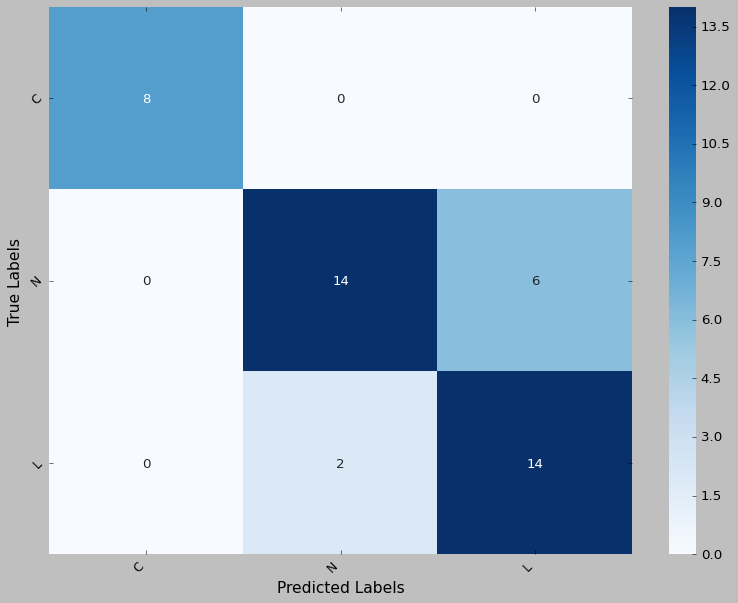

In [ ]:
################ Running and testing the model. please uncomment one of the blocks #########################

# train_data = np.load('train_data_rgb.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_rgb.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_rgb.npy',allow_pickle='TRUE').item()

# train_data = np.load('train_data_rgb_segmented_EARLY.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_rgb_segmented_EARLY.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_rgb_segmented_EARLY.npy',allow_pickle='TRUE').item()

# train_data = np.load('train_data_splitted.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_splitted.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_splitted.npy',allow_pickle='TRUE').item()

# train_data = np.load('train_data_importance.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_importance.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_importance.npy',allow_pickle='TRUE').item()

# train_data = np.load('train_data_importance_10_56_141.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_importance_10_56_141.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_importance_10_56_141.npy',allow_pickle='TRUE').item()

# train_data = np.load('train_data_importance_2_60_102_140.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_importance_2_60_102_140.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_importance_2_60_102_140.npy',allow_pickle='TRUE').item()

# train_data = np.load('train_data_importance_2_60_102_140_segmented.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_importance_2_60_102_140_segmented.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_importance_2_60_102_140_segmented.npy',allow_pickle='TRUE').item()

# train_data = np.load('train_data_importanc.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_importance.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_importance.npy',allow_pickle='TRUE').item()


# train_data = np.load('train_data_article_ipmortance_490_550_720_segmented_EARLY.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_article_ipmortance_490_550_720_segmented_EARLY.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_article_ipmortance_490_550_720_segmented_EARLY.npy',allow_pickle='TRUE').item()


# train_data = np.load('train_data_article_ipmortance_490_550_720_EARLY.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_article_ipmortance_490_550_720_EARLY.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_article_ipmortance_490_550_720_EARLY.npy',allow_pickle='TRUE').item()

# train_data = np.load('train_data_article_ipmortance_490_550_720.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_article_ipmortance_490_550_720.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_article_ipmortance_490_550_720.npy',allow_pickle='TRUE').item()

# train_data = np.load('train_data_article_ipmortance_490_550_720_segmented.npy',allow_pickle='TRUE').item()
# val_data = np.load('val_data_article_ipmortance_490_550_720_segmented.npy',allow_pickle='TRUE').item()
# test_data = np.load('test_data_article_ipmortance_490_550_720_segmented.npy',allow_pickle='TRUE').item()

np.random.seed(97)
tf.random.set_seed(97)
# trained_model = keras.models.load_model('saved_model')

trained_model,train_data['images'],train_data['labels'],test_data['images'],test_data['labels'] = train_Base_model(train_data, val_data, test_data)
print("phase 2/2 - test the model on the test images")
predictions_prob=trained_model.predict(test_data['images'])
test(trained_model,predictions_prob,test_data['images'],test_data['labels'],1,1)